# Guide 4
> Ahilan Kumaresan

In [21]:
import matplotlib.pyplot as plt
plt.style.use('dark_background')
import numpy as np

## Task 1: Flight to the Moon: Apollo 8

A rocket is launched out from the earth and must pass by the moon and hopefully return to earth. The three objects interact gravitationally via Newton's law of gravity. Recall, the force of gravity on object 2 (with mass $m_2$) due to object 1 (with mass $m_1$) is

$$\vec{F}_{12} = -\hat{r}_{12} \frac{G m_1 m_2}{r_{12}^2}$$

where the displacement vector $\vec{r}_{12}$ points from 1 to 2, and the minus sign indicates that the force is in the opposite direction (i.e., attractive). Here $G = 6.6743015 \times 10^{-11}$ N m²/kg². The mass of the Earth is $m_E = 5.972 \times 10^{24}$ kg, and the mass of the Moon is $m_M = 7.34767 \times 10^{22}$ kg.

### 1. Analysis

If we're considering just the motion of the rocket, why don't we need to know its mass? 

**ANS:** Firstly, in our three body system, comparing to the masses of Earth and Moon, our rocket's mass would be negligible. 

Most importantly, when we have Net Force on Body 1 ($\vec{F}_{1}$): Sum of forces from 2 and 3:

$$\vec{F}_{1} = \vec{F}_{21} + \vec{F}_{31}$$

Notice that since $F_1$ (let this be our rocket) $= m_1 a_1$, the $m_1$ on both sides would be cancelled.

2.

The Earth is fixed at the origin. The moon moves counter-clockwise around the Earth on a circular path with radius D = 3.84 x 108 m (it is actually pretty circular). When the rocket is launched at t = 0, the moon is at an angular position α < 0 (in radians), so the initial (x,y) coordinates are (D cos α, D sin α). It then carries out its uniform circular motion, going counter-clockwise around the Earth. From Kepler’s laws, the period of the moon’s orbit around the earth is 𝑇2=4π2𝐷3/𝐺𝑚E and the corresponding angular frequency is ω2=𝐺𝑚E/𝐷3.

In [22]:
D = 3.84 * 10**8 # m
G = 6.6743015 * 10**-11 # N m2/kg2
me = 5.972 * 10**24 # Kg
mM = 7.34767 * 10**22 # Kg


def T(D=D,G=G,me=me,mM=mM):
    t2 = (4*np.pi**2 * D**3)/(G*me)
    print(f"Value of T is: {np.sqrt(t2)}")
    return np.sqrt(t2)

T()


def w(G=G,me=me, D=D):
    w2 = ((G*me)/D**3)
    return np.sqrt(w2)

w()

Value of T is: 2368175.559711484


np.float64(2.653175471477744e-06)

### 3. Analysis

What equations do you need to use to calculate the moon's $(x,y)$ location at $t > 0$? 

The position of an object in uniform circular motion with radius $D$, angular velocity $\omega$, and period $T$ is described by the vector equation:

$$\vec{r}(t) = D\cos(\omega t)\,\hat{i} + D\sin(\omega t)\,\hat{j}$$

The angular velocity is related to the period by $\omega = \frac{2\pi}{T}$, allowing the position to be expressed as:

$$\vec{r}(t) = D\cos\left(\frac{2\pi t}{T}\right)\hat{i} + D\sin\left(\frac{2\pi t}{T}\right)\hat{j}$$

The angular position at time $t$ is:

$$\alpha(t) = \omega t = \frac{2\pi t}{T}$$

You’re going to start with your rocket on the surface of the earth and launch it radially outwards (as shown in the schematic above) with some initial velocity. The initial position of the rocket is (RE, 0) on the x-axis, for earth radius RE = 6.3781 x 106 m (the radius of the moon RM = 1.74 x 106 m). The initial velocity of the rocket is along the x-axis with values (v0, 0).

An estimate of the approximate speed that you need at launch is to consider the situation where it makes it out to the moon’s orbit. Conservation of energy dictates that
12𝑚𝑣02−𝐺𝑚E𝑚𝑅E=−𝐺𝑚E𝑚𝐷

In [23]:
Re = 6.3781*10**6
RM = 1.74*10**6

# 4.  Using the values for the various masses and distances, 
# calculate an estimate for the launch velocity to just reach the moon’s 
# orbit using the equation above. (This will be a good starting guess.)

# This basically means, solve the above equation for v with various values of m and D
# The mass and the distance the Rocket travels


In [24]:
RM

1740000.0

$$v_0 = \sqrt{2 G M_E \left(\frac{1}{R_E} - \frac{1}{D}\right)}$$

Notice how $m$, the mass of the rocket, cancels out.

In [25]:
# 4. contd..

def v0(D, G=G, me=me,Re=Re):
    num = 2*G*me*((1/Re)-(1/D))
    print(f"For D = {D} (m)     |v0 = {np.sqrt(num)} (m/s)")
    return np.sqrt(num)

v0(D=1*Re)
v0(D=2*Re)

v0(D=D)



For D = 6378100.0 (m)     |v0 = 0.0 (m/s)
For D = 12756200.0 (m)     |v0 = 7905.278018216909 (m/s)
For D = 384000000.0 (m)     |v0 = 11086.51682126587 (m/s)


np.float64(11086.51682126587)

### 5. Setting up the ODE

Your state vector $\vec{S}$ will contain four variables: $[x, y, v_x, v_y]$. The function you pass to `solve_ivp` must return their derivatives:

$$\frac{d\vec{S}}{dt} = \left[\frac{dx}{dt}, \frac{dy}{dt}, \frac{dv_x}{dt}, \frac{dv_y}{dt}\right]$$

The acceleration components come from gravitational forces by Earth and Moon:

$$\frac{dv_x}{dt} = a_{E,x} + a_{M,x} = -\frac{G m_E \, x}{r_E^3} - \frac{G m_M (x - x_M)}{r_M^3}$$

$$\frac{dv_y}{dt} = a_{E,y} + a_{M,y} = -\frac{G m_E \, y}{r_E^3} - \frac{G m_M (y - y_M)}{r_M^3}$$

where $r_E = \sqrt{x^2 + y^2}$ is the distance to Earth and $r_M = \sqrt{(x-x_M)^2 + (y-y_M)^2}$ is the distance to Moon.

In [26]:
# 5. contd

def ode_3Body(t, S, M1=me, M2=mM,D=D ,G=G, omega=w(),alpha=0):
    """
    S: For State in  x, y, vx, vy = S

    We find and Return the Derevative of the State
    """
    
    rx,ry,vx,vy = S

    # Moon position
    xM = D * np.cos(omega * t + alpha)
    yM = D * np.sin(omega * t + alpha)
    
    # Distances
    dist_E = np.sqrt(rx**2 + ry**2)
    dist_M = np.sqrt((rx - xM)**2 + (ry - yM)**2)
    
    # Accel from Earth
    ax_E = -G * M1 * rx / dist_E**3
    ay_E = -G * M1 * ry / dist_E**3
    
    # Accel from Moon
    ax_M = -G * M2 * (rx - xM) / dist_M**3
    ay_M = -G * M2 * (ry - yM) / dist_M**3
    
    ax = ax_E + ax_M
    ay = ay_E + ay_M

    dS_dt = [vx,vy,ax,ay]
    
    return dS_dt


In [27]:
# 6. 

# Check that your function is working properly. 
# If you input the rocket’s initial position of (RE, 0) and velocity 
# (v0, 0) and have the location of the moon at (D, 0), what acceleration 
# does your function return?

ode_3Body(t=0, S=(Re,0,v0(D),0),
          M1=me,M2=mM)

For D = 384000000.0 (m)     |v0 = 11086.51682126587 (m/s)


[np.float64(11086.51682126587),
 0,
 np.float64(-9.798090528202453),
 np.float64(-0.0)]

### 7. 



## Task 2: Rocket Trajectories Calculations

For D = 384000000.0 (m)     |v0 = 11086.51682126587 (m/s)


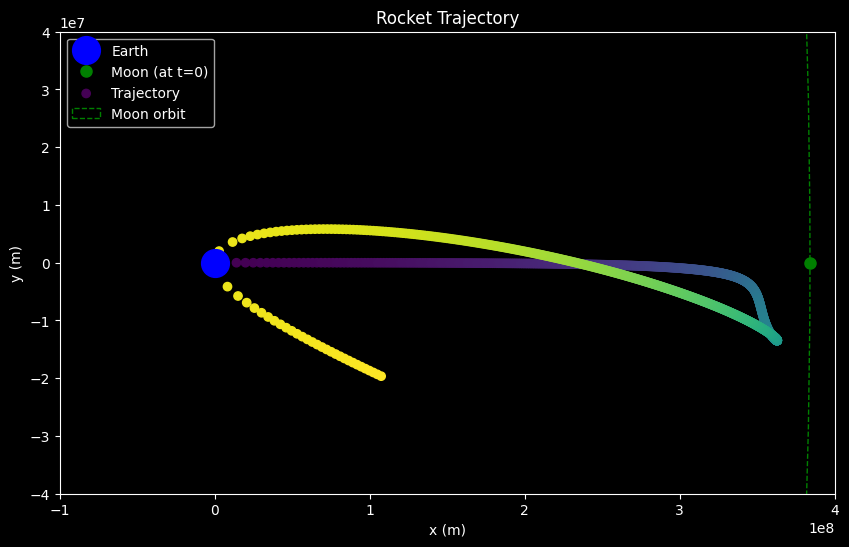

In [28]:
# 1.  
from scipy.integrate import solve_ivp
# We use scipy's solve_ivp, tell it our function, and tell it to find the evolution in time tf.
# solve_ivp reperdlty calls our function in increements of time until it reaches the time we need. 

# Initial conditions

# Start at Earth's surface
x0 = Re          
y0 = 0

# Launch velocity to reach Moon's orbit
vx0 = v0(D) - 10 # m/s
vy0 = 0

S0 = [x0, y0, vx0, vy0] # Our Inital State

ti = 0
tf = (10*24*60 * 60) + (1*60*60) # 24 Hours in Seconds
t_eval = np.linspace(0, tf, 1000)  # 1000 time points


#solution = solve_ivp( ode_3Body, t_span=(ti,tf), y0=S0)
# Hey btw, here I had to chnage the function becase you need soem weird gymnastics to pass arguments
# into solve_ivp, so i predefined the additonal varibales above in the ode_3Body function

solution = solve_ivp(
    fun=lambda t, S: ode_3Body(t, S, M1=me, M2=mM,alpha=-1),  # Wrapper function to overcome the 
    # argument issue I faced above 
    t_span=(ti,tf),      # Time range (start, end)
    y0=S0,              # Initial state
    t_eval=t_eval,)
# Ok nm, I need to play around with alpha down, so i better add something like a 
# lambda function to play around the arguments with

# Extract position
x = solution.y[0]  # x-coordinates
y = solution.y[1]  # y-coordinates

# Plot the trajectory
plt.figure(figsize=(10, 6))
plt.plot(0, 0, 'bo', markersize=20, label='Earth')
plt.plot(D, 0, 'go', markersize=8, label='Moon (at t=0)')


#plt.plot(x, y,'r' ,label='Rocket trajectory')
# I am switching to a gradient plot using a scatter plot so that I can differencate the line
# The overlapping lines above make it hard to understand which trip the rocket is taking!! so
# Gradient trajectory using scatter
plt.scatter(x, y, c=range(len(x)), cmap='viridis',label="Trajectory")


import matplotlib.patches as mpatches
# Add Moon's orbit as a dashed circle
moon_orbit = mpatches.Circle((0, 0), D,fill=False,
                             color='green', linestyle='--', 
                             label='Moon orbit')
plt.gca().add_patch(moon_orbit)


plt.xlabel('x (m)')
plt.ylabel('y (m)')
plt.ylim(-4*1e7,4*1e7)
plt.xlim(-1*1e8,4*1e8)

plt.legend()
plt.title('Rocket Trajectory')
plt.show()


> **Ahilan Notes:** Hold on, this is interesting! 

 So, somehow, I just need to increase the `tf` to make the rocket reach the moon, but I must optimize the $v_0$ in order to make it return? This is cool and interesting, what is happening?

### 2. Effect of Moon's Initial Position

Now, remember that $\alpha$ is the Moon's angular position. If we make the alpha more negative, the Moon's initial position is lower. I am thinking that $v_0$ must increase because the displacement is now higher, and the angular separation is also more, so we need more initial velocity to achieve this. 

In terms of code, it would be nice if I can see the current position of the Moon updated to the position. Changing the alpha, I am not sure if my trajectory is reaching the moon right now. 

> **Note:** Gravitational assist plays a role in this. The Moon is under the launch axis, so the Moon's gravitational pull has a component that opposes the rocket's motion at the start.

## Task 3: Animating Your Trajectory

**Note on Moon Trajectory:**

For the Moon modeled as uniform circular motion, define the initial angular position as $\alpha$ at $t=0$, then evolve it in time:

$$\theta(t) = \alpha + \omega t$$

If the orbit radius is $R$, then the position in the orbital plane is:

$$x(t) = R \cos(\alpha + \omega t), \quad y(t) = R \sin(\alpha + \omega t)$$

In [29]:
alpha = -0.5
vx0 = v0(D) - 10 # m/s
vy0 = 0


S0 = [x0, y0, vx0, vy0] # Our Inital State

ti = 0
tf = (10*24*60 * 60) + (1*60*60) # 10 days, 24 Hours in Seconds
t_eval = np.linspace(0, tf, 10_000)  # 10,000 time points


#solution = solve_ivp( ode_3Body, t_span=(ti,tf), y0=S0)
# Hey btw, here I had to chnage the function becase you need soem weird gymnastics to pass arguments
# into solve_ivp, so i predefined the additonal varibales above in the ode_3Body function

solution = solve_ivp(
    fun=lambda t, S: ode_3Body(t, S, M1=me, M2=mM,alpha=alpha),  # Wrapper function to overcome the 
    # argument issue I faced above 
    t_span=(ti,tf),      # Time range (start, end)
    y0=S0,              # Initial state
    t_eval=t_eval,)

# Extract position
x = solution.y[0]  # x-coordinates
y = solution.y[1]  # y-coordinates

rocket_pos = np.array([x,y]).T
print(f"rocket Pos Shape: {rocket_pos.shape}" )

## For Mood cordinates, use (D cos α + wt, D sin α+wt).


xM = D * np.cos(alpha + w()*t_eval)
yM = D * np.sin(alpha+ w()*t_eval)


Moon_pos = np.array([xM,yM]).T
print(f"Moon Pos Shape: {Moon_pos.shape}" )



For D = 384000000.0 (m)     |v0 = 11086.51682126587 (m/s)
rocket Pos Shape: (10000, 2)
Moon Pos Shape: (10000, 2)


**Ahilan Notes:** Today, I learnt once again that checking the dimensions or shape of variables after making them is often a great way to debug. I found out I needed the extra $\omega t$ factor for time evolution only after this!

So when we say `[[xs],[ys]]`, this makes 1000 rows with 2 columns, shape `(10K, 2)`. To make this `[[x0,y0],[x1,y1]...]` we can just transpose this, so shape `(2, 10K)`.

In [30]:
# 3.  

%matplotlib widget

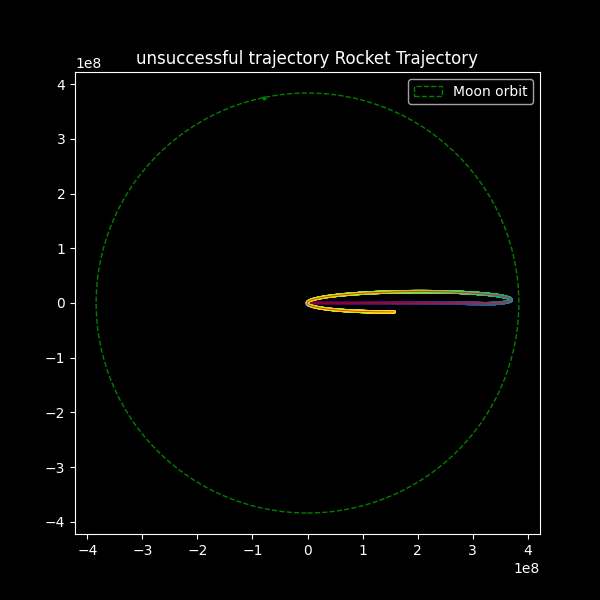

In [31]:
# 4. # Source: Canvas->Notes->Guide4_Animation.ipynb (From Prof)


from matplotlib.animation import FuncAnimation

# rMs is an (nTime x 2) set of (x,y) coordinates for the moon, where nTime is the number of time points
# rRs is an (nTime x 2) set of (x,y) coordinates for the rocket

fig = plt.figure(figsize=(6,6))   # create a figure of particular size
# set axes limits
plt.xlim(-1.1*D, 1.1*D)
plt.ylim(-1.1*D, 1.1*D)


rMs = Moon_pos
rRs = rocket_pos
# plot starting points for earth, moon, and rocket
scatE = plt.scatter([0.0], [0.0], s=20, c = 'b')  # plot earth's position
scatM = plt.scatter([rMs[0,0]], [rMs[0,1]], s=4, c='g')  # plot moon's position
scatR = plt.scatter([rRs[0,0]], [rRs[0,1]], s=1, c='r')  # plot rocket as a point
lineR, = plt.plot(rRs[0,0], rRs[0,1], lw=0.5, c='r')  # this starts a line plot of rocket's trajectory

# Gradient scatter trail - start empty
trail = plt.scatter([], [], s=2, c=[], cmap='viridis', vmin=0, vmax=len(rRs))

moon_orbit = mpatches.Circle((0, 0), D,fill=False,
                             color='green', linestyle='--', 
                             label='Moon orbit')
plt.gca().add_patch(moon_orbit)

plt.legend()
plt.title('unsuccessful trajectory Rocket Trajectory')

# update function for animation  
# updates the various plots with the points in the i-th frame
# to be repeatedly called by the animation
def update_plot(i):
    scatM.set_offsets(rMs[i])  # update moon's position
    scatR.set_offsets(rRs[i])  # update rocket's position
    lineR.set_data(rRs[:i,0], rRs[:i,1])  # update rocket's line trajectory
    #return

    # Update gradient scatter trail
    trail.set_offsets(rRs[:i])
    trail.set_array(np.arange(i))
    return




from IPython.display import HTML

# animation
ani = FuncAnimation(fig, update_plot, frames=np.arange(0, len(rRs), 100), interval=50)  # every 10th frame
HTML(ani.to_jshtml())


For Un-Successful Trial (Sorry I had to keep this example, it Crashes, which I thik is prerrty cool)

For D = 384000000.0 (m)     |v0 = 11086.51682126587 (m/s)
rocket Pos Shape: (10000, 2)
Moon Pos Shape: (10000, 2)


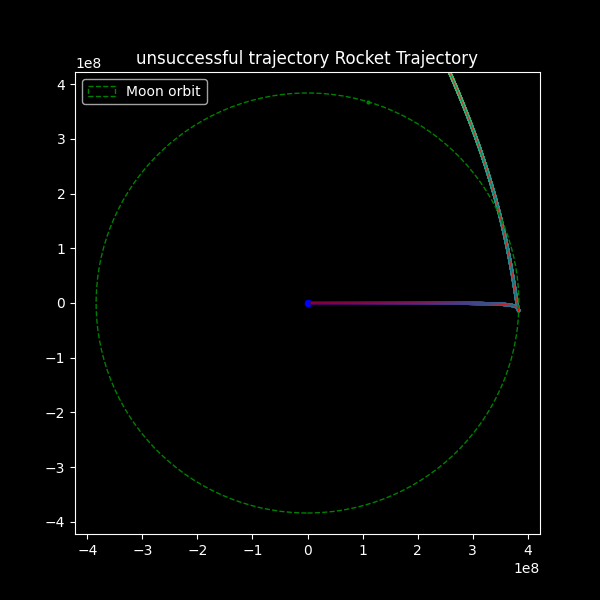

In [32]:
alpha = -1
vx0 = v0(D) # m/s
vy0 = 0


S0 = [x0, y0, vx0, vy0] # Our Inital State

ti = 0
tf = (10*24*60 * 60) + (1*60*60) # 10 days, 24 Hours in Seconds
t_eval = np.linspace(0, tf, 10_000)  # 10,000 time points


#solution = solve_ivp( ode_3Body, t_span=(ti,tf), y0=S0)
# Hey btw, here I had to chnage the function becase you need soem weird gymnastics to pass arguments
# into solve_ivp, so i predefined the additonal varibales above in the ode_3Body function

solution = solve_ivp(
    fun=lambda t, S: ode_3Body(t, S, M1=me, M2=mM,alpha=alpha),  # Wrapper function to overcome the 
    # argument issue I faced above 
    t_span=(ti,tf),      # Time range (start, end)
    y0=S0,              # Initial state
    t_eval=t_eval,)

# Extract position
x = solution.y[0]  # x-coordinates
y = solution.y[1]  # y-coordinates

rocket_pos = np.array([x,y]).T
print(f"rocket Pos Shape: {rocket_pos.shape}" )

## For Mood cordinates, use (D cos α + wt, D sin α+wt).


xM = D * np.cos(alpha + w()*t_eval)
yM = D * np.sin(alpha+ w()*t_eval)


Moon_pos = np.array([xM,yM]).T
print(f"Moon Pos Shape: {Moon_pos.shape}" )





# 4. # Source: Canvas->Notes->Guide4_Animation.ipynb (From Prof)


from matplotlib.animation import FuncAnimation

# rMs is an (nTime x 2) set of (x,y) coordinates for the moon, where nTime is the number of time points
# rRs is an (nTime x 2) set of (x,y) coordinates for the rocket

fig = plt.figure(figsize=(6,6))   # create a figure of particular size
# set axes limits
plt.xlim(-1.1*D, 1.1*D)
plt.ylim(-1.1*D, 1.1*D)


rMs = Moon_pos
rRs = rocket_pos
# plot starting points for earth, moon, and rocket
scatE = plt.scatter([0.0], [0.0], s=20, c = 'b')  # plot earth's position
scatM = plt.scatter([rMs[0,0]], [rMs[0,1]], s=4, c='g')  # plot moon's position
scatR = plt.scatter([rRs[0,0]], [rRs[0,1]], s=1, c='r')  # plot rocket as a point
lineR, = plt.plot(rRs[0,0], rRs[0,1], lw=0.5, c='r')  # this starts a line plot of rocket's trajectory

# Gradient scatter trail - start empty
trail = plt.scatter([], [], s=2, c=[], cmap='viridis', vmin=0, vmax=len(rRs))

moon_orbit = mpatches.Circle((0, 0), D,fill=False,
                             color='green', linestyle='--', 
                             label='Moon orbit')
plt.gca().add_patch(moon_orbit)

plt.legend()
plt.title('unsuccessful trajectory Rocket Trajectory')

# update function for animation  
# updates the various plots with the points in the i-th frame
# to be repeatedly called by the animation
def update_plot(i):
    scatM.set_offsets(rMs[i])  # update moon's position
    scatR.set_offsets(rRs[i])  # update rocket's position
    lineR.set_data(rRs[:i,0], rRs[:i,1])  # update rocket's line trajectory
    #return

    # Update gradient scatter trail
    trail.set_offsets(rRs[:i])
    trail.set_array(np.arange(i))
    return




from IPython.display import HTML

# animation
ani = FuncAnimation(fig, update_plot, frames=np.arange(0, len(rRs), 100), interval=50)  # every 10th frame
HTML(ani.to_jshtml())


For un-succesfull Attempt (Loop)

For D = 384000000.0 (m)     |v0 = 11086.51682126587 (m/s)
rocket Pos Shape: (10000, 2)
Moon Pos Shape: (10000, 2)


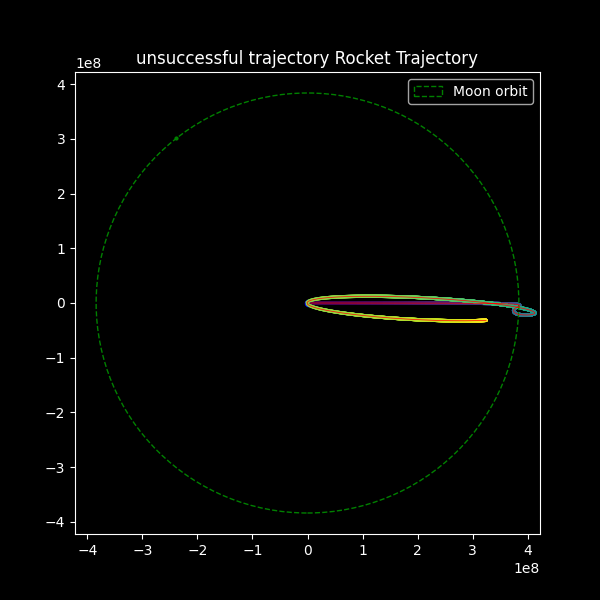

In [33]:
alpha = -1.4
vx0 = v0(D) # m/s
vy0 = 0


S0 = [x0, y0, vx0, vy0] # Our Inital State

ti = 0
tf = (16*24*60 * 60) + (1*60*60) # 10 days, 24 Hours in Seconds
t_eval = np.linspace(0, tf, 10_000)  # 10,000 time points


#solution = solve_ivp( ode_3Body, t_span=(ti,tf), y0=S0)
# Hey btw, here I had to chnage the function becase you need soem weird gymnastics to pass arguments
# into solve_ivp, so i predefined the additonal varibales above in the ode_3Body function

solution = solve_ivp(
    fun=lambda t, S: ode_3Body(t, S, M1=me, M2=mM,alpha=alpha),  # Wrapper function to overcome the 
    # argument issue I faced above 
    t_span=(ti,tf),      # Time range (start, end)
    y0=S0,              # Initial state
    t_eval=t_eval,)

# Extract position
x = solution.y[0]  # x-coordinates
y = solution.y[1]  # y-coordinates

rocket_pos = np.array([x,y]).T
print(f"rocket Pos Shape: {rocket_pos.shape}" )

## For Mood cordinates, use (D cos α + wt, D sin α+wt).


xM = D * np.cos(alpha + w()*t_eval)
yM = D * np.sin(alpha+ w()*t_eval)


Moon_pos = np.array([xM,yM]).T
print(f"Moon Pos Shape: {Moon_pos.shape}" )





# 4. # Source: Canvas->Notes->Guide4_Animation.ipynb (From Prof)


from matplotlib.animation import FuncAnimation

# rMs is an (nTime x 2) set of (x,y) coordinates for the moon, where nTime is the number of time points
# rRs is an (nTime x 2) set of (x,y) coordinates for the rocket

fig = plt.figure(figsize=(6,6))   # create a figure of particular size
# set axes limits
plt.xlim(-1.1*D, 1.1*D)
plt.ylim(-1.1*D, 1.1*D)


rMs = Moon_pos
rRs = rocket_pos
# plot starting points for earth, moon, and rocket
scatE = plt.scatter([0.0], [0.0], s=20, c = 'b')  # plot earth's position
scatM = plt.scatter([rMs[0,0]], [rMs[0,1]], s=4, c='g')  # plot moon's position
scatR = plt.scatter([rRs[0,0]], [rRs[0,1]], s=1, c='r')  # plot rocket as a point
lineR, = plt.plot(rRs[0,0], rRs[0,1], lw=0.5, c='r')  # this starts a line plot of rocket's trajectory

# Gradient scatter trail - start empty
trail = plt.scatter([], [], s=2, c=[], cmap='viridis', vmin=0, vmax=len(rRs))

moon_orbit = mpatches.Circle((0, 0), D,fill=False,
                             color='green', linestyle='--', 
                             label='Moon orbit')
plt.gca().add_patch(moon_orbit)

plt.legend()
plt.title('unsuccessful trajectory Rocket Trajectory')

# update function for animation  
# updates the various plots with the points in the i-th frame
# to be repeatedly called by the animation
def update_plot(i):
    scatM.set_offsets(rMs[i])  # update moon's position
    scatR.set_offsets(rRs[i])  # update rocket's position
    lineR.set_data(rRs[:i,0], rRs[:i,1])  # update rocket's line trajectory
    #return

    # Update gradient scatter trail
    trail.set_offsets(rRs[:i])
    trail.set_array(np.arange(i))
    return




from IPython.display import HTML

# animation
ani = FuncAnimation(fig, update_plot, frames=np.arange(0, len(rRs), 100), interval=50)  # every 10th frame
HTML(ani.to_jshtml())


For Successful

For D = 384000000.0 (m)     |v0 = 11086.51682126587 (m/s)
rocket Pos Shape: (10000, 2)
Moon Pos Shape: (10000, 2)


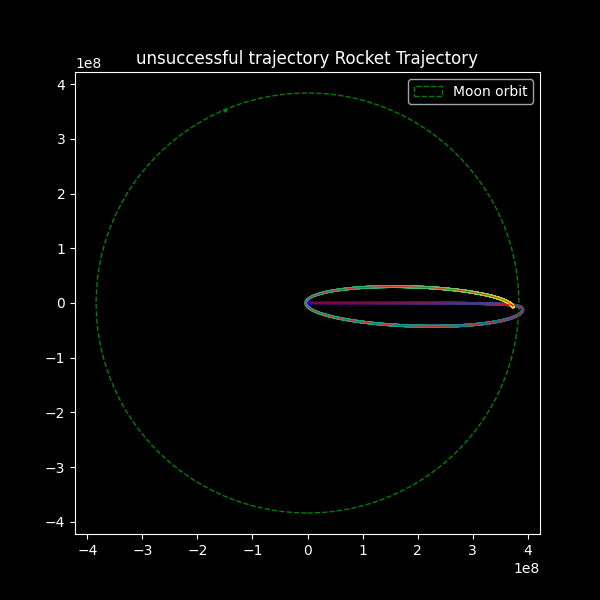

In [34]:
alpha = -0.76
vx0 = v0(D) + 16  # m/s
vy0 = -2


S0 = [x0, y0, vx0, vy0] # Our Inital State

ti = 0
tf = (12*24*60 * 60) + (1*60*60) # 10 days, 24 Hours in Seconds
t_eval = np.linspace(0, tf, 10_000)  # 10,000 time points


#solution = solve_ivp( ode_3Body, t_span=(ti,tf), y0=S0)
# Hey btw, here I had to chnage the function becase you need soem weird gymnastics to pass arguments
# into solve_ivp, so i predefined the additonal varibales above in the ode_3Body function

solution = solve_ivp(
    fun=lambda t, S: ode_3Body(t, S, M1=me, M2=mM,alpha=alpha),  # Wrapper function to overcome the 
    # argument issue I faced above 
    t_span=(ti,tf),      # Time range (start, end)
    y0=S0,              # Initial state
    t_eval=t_eval,)

# Extract position
x = solution.y[0]  # x-coordinates
y = solution.y[1]  # y-coordinates

rocket_pos = np.array([x,y]).T
print(f"rocket Pos Shape: {rocket_pos.shape}" )

## For Mood cordinates, use (D cos α + wt, D sin α+wt).


xM = D * np.cos(alpha + w()*t_eval)
yM = D * np.sin(alpha+ w()*t_eval)


Moon_pos = np.array([xM,yM]).T
print(f"Moon Pos Shape: {Moon_pos.shape}" )





# 4. # Source: Canvas->Notes->Guide4_Animation.ipynb (From Prof)


from matplotlib.animation import FuncAnimation

# rMs is an (nTime x 2) set of (x,y) coordinates for the moon, where nTime is the number of time points
# rRs is an (nTime x 2) set of (x,y) coordinates for the rocket

fig = plt.figure(figsize=(6,6))   # create a figure of particular size
# set axes limits
plt.xlim(-1.1*D, 1.1*D)
plt.ylim(-1.1*D, 1.1*D)


rMs = Moon_pos
rRs = rocket_pos
# plot starting points for earth, moon, and rocket
scatE = plt.scatter([0.0], [0.0], s=20, c = 'b')  # plot earth's position
scatM = plt.scatter([rMs[0,0]], [rMs[0,1]], s=4, c='g')  # plot moon's position
scatR = plt.scatter([rRs[0,0]], [rRs[0,1]], s=1, c='r')  # plot rocket as a point
lineR, = plt.plot(rRs[0,0], rRs[0,1], lw=0.5, c='r')  # this starts a line plot of rocket's trajectory

# Gradient scatter trail - start empty
trail = plt.scatter([], [], s=1.2, c=[], cmap='viridis', vmin=0, vmax=len(rRs))

moon_orbit = mpatches.Circle((0, 0), D,fill=False,
                             color='green', linestyle='--', 
                             label='Moon orbit')
plt.gca().add_patch(moon_orbit)

plt.legend()
plt.title('unsuccessful trajectory Rocket Trajectory')

# update function for animation  
# updates the various plots with the points in the i-th frame
# to be repeatedly called by the animation
def update_plot(i):
    scatM.set_offsets(rMs[i])  # update moon's position
    scatR.set_offsets(rRs[i])  # update rocket's position
    lineR.set_data(rRs[:i,0], rRs[:i,1])  # update rocket's line trajectory
    #return

    # Update gradient scatter trail
    trail.set_offsets(rRs[:i])
    trail.set_array(np.arange(i))
    return




from IPython.display import HTML

# animation
ani = FuncAnimation(fig, update_plot, frames=np.arange(0, len(rRs), 100), interval=50)  # every 10th frame
HTML(ani.to_jshtml())


### 5. 

How motion of rocket chnages over the course of each tragetory. 

ANS: I am not exatly sure what observation you are looking for, but in the unsucessful ones, the rocket moves rather too fast and hence travels very straight. This makes the rocket only be influced by a very close proximity of the moon where the force by the inverse sqare law is too high, hence there is a very sharp deflection, almost like a collision. and the rocket looses stability and exits orbit. 

In the Sucessful the velocity is such that the rocket just slows down near the moon, such that near the moon it can get just influenced enough that it begins to orbit around the moon and as the moon leaves, there is still enough velcoity in the x direction that it forces it to return to earth. 

In [35]:
# 6.  

%matplotlib inline

## Task 4: Map Out Launch Strategies

In this section, we systematically explore the parameter space of $\alpha$ (Moon's initial angular position) and $v_0$ (launch velocity) to understand what combinations allow for successful free-return trajectories.

In [36]:
alphas = np.arange(-1,-0.6,0.1)
alphas

array([-1. , -0.9, -0.8, -0.7])

In [37]:
# 1. Parameter sweep - testing different alpha and v0 combinations

dv_values = np.linspace(-50, 150, 41)
v0_base = v0(D)

results = {}

for alpha in alphas:
    results[alpha] = []
    
    for dv in dv_values:
        vx0 = v0_base + dv
        S0 = [x0, y0, vx0, 0]
        tf = 12*24*60*60
        t_eval = np.linspace(0, tf, 2000)
        
        sol = solve_ivp(
            fun=lambda t, S, a=alpha: ode_3Body(t, S, M1=me, M2=mM, alpha=a),
            t_span=(0, tf), y0=S0, t_eval=t_eval
        )
        
        x, y = sol.y[0], sol.y[1]
        
        # Calculate distances
        dist_earth = np.sqrt(x**2 + y**2)
        xM = D * np.cos(alpha + w() * t_eval[:len(x)])
        yM = D * np.sin(alpha + w() * t_eval[:len(x)])
        dist_moon = np.sqrt((x - xM)**2 + (y - yM)**2)
        
        # Success: passed D, 
        # came back to 2*Re after launch, 
        # didn't crash into moon, so distance to moon always more than radius

        
        if np.max(dist_earth) > D and np.min(dist_earth[len(x)//2:]) < 2*Re and np.min(dist_moon) > RM:
            results[alpha].append({
                'v0': vx0,
                'min_moon': np.min(dist_moon),
                'return_time': tf  # approximate
            })
    
print(f"  Found {len(results[alpha])} successful")

For D = 384000000.0 (m)     |v0 = 11086.51682126587 (m/s)
  Found 3 successful


Alphas with successful trajectories: [np.float64(-1.0), np.float64(-0.9), np.float64(-0.8), np.float64(-0.7000000000000001)]


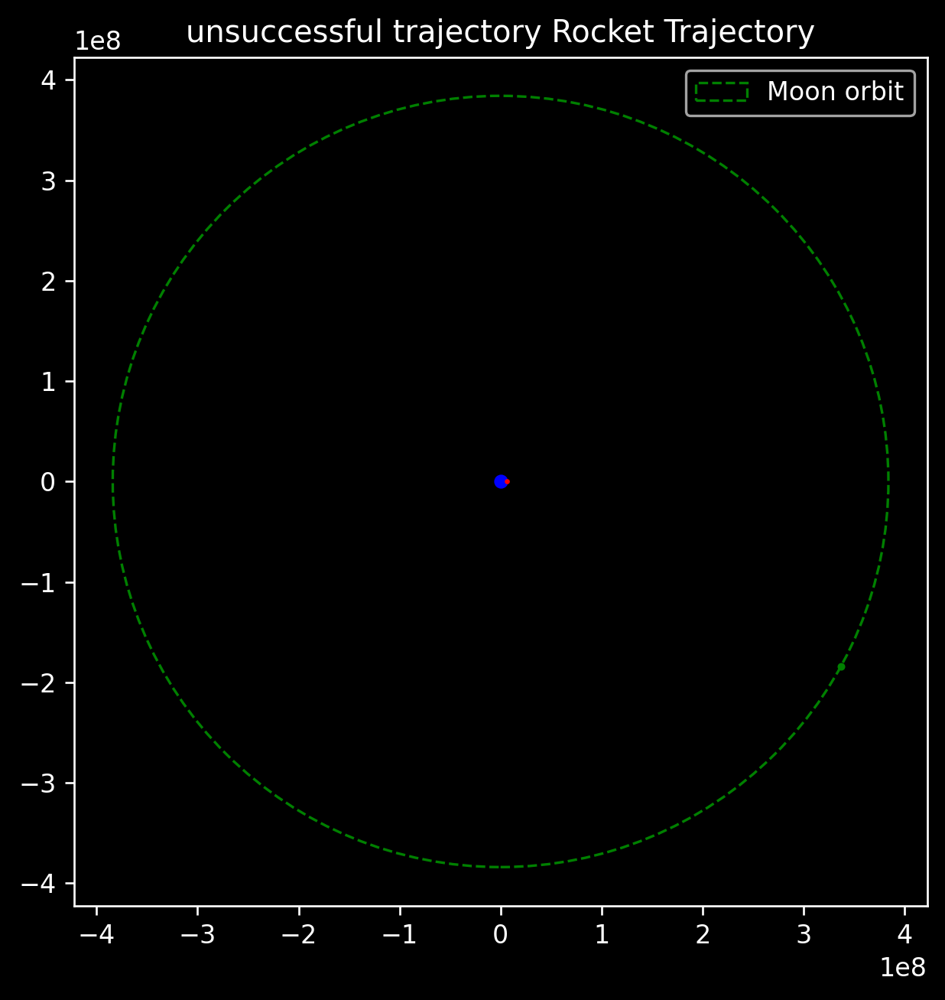

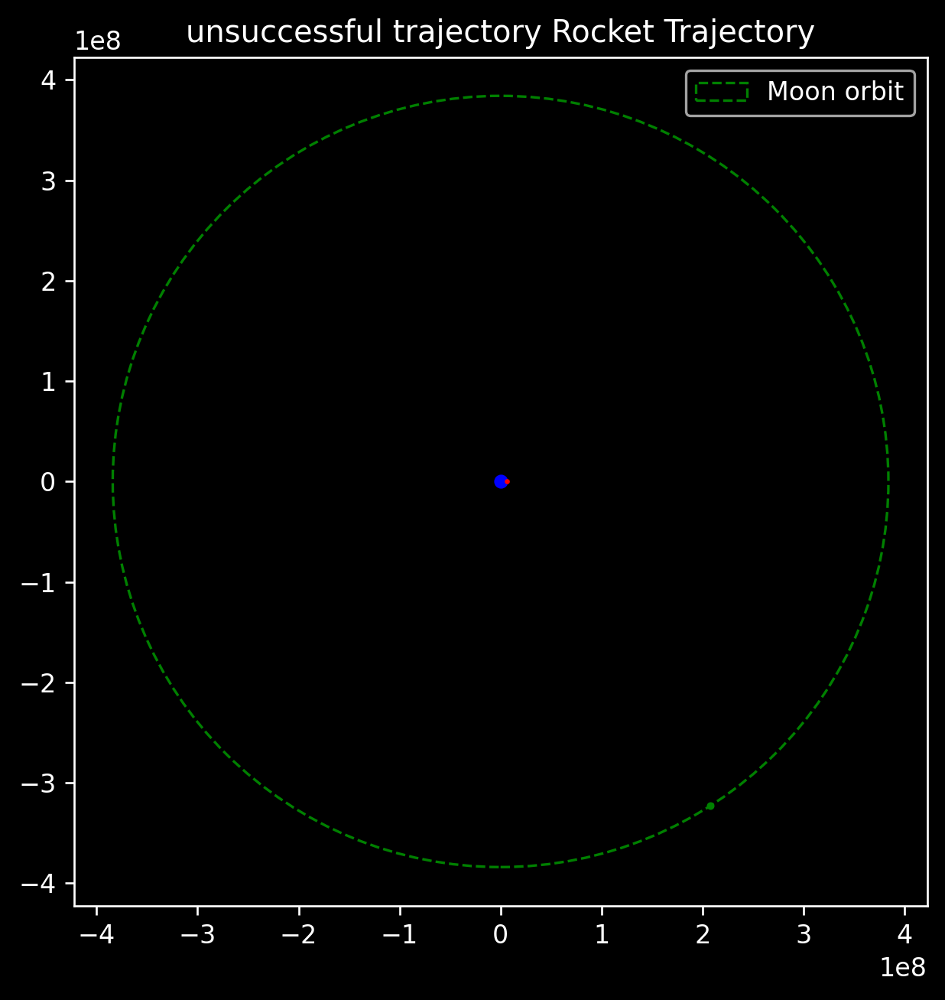

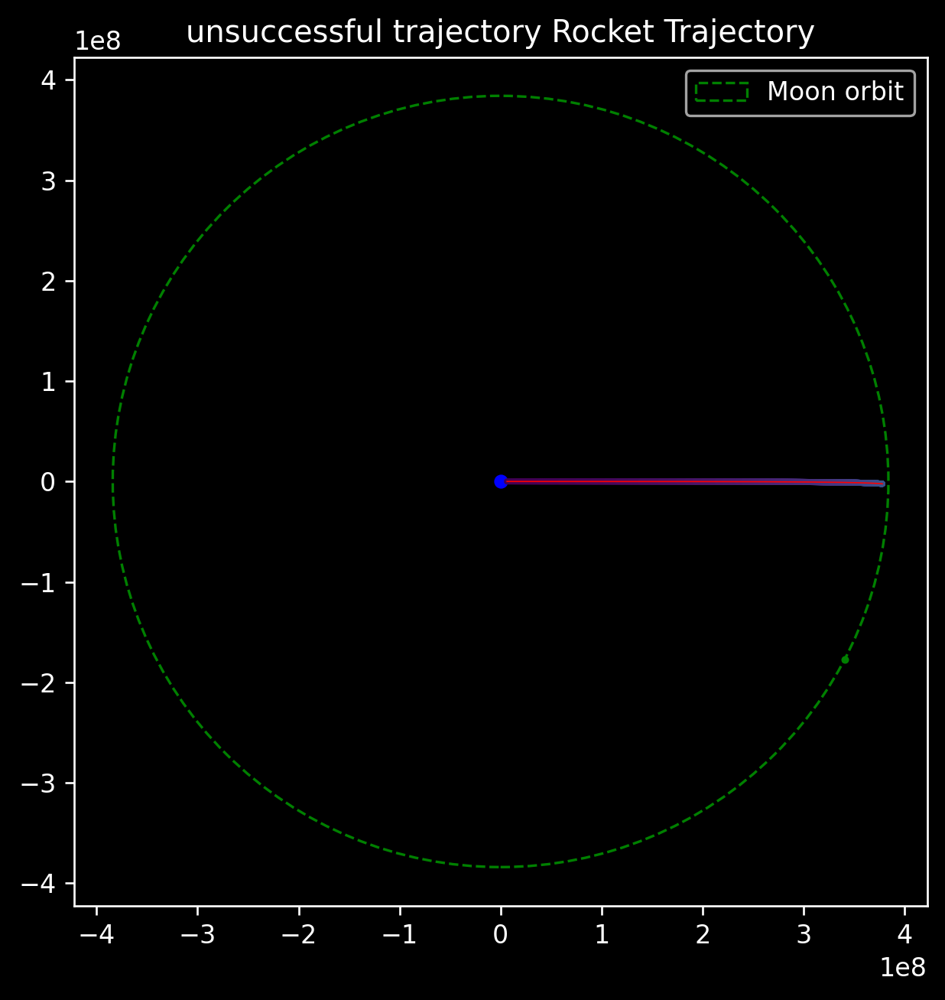

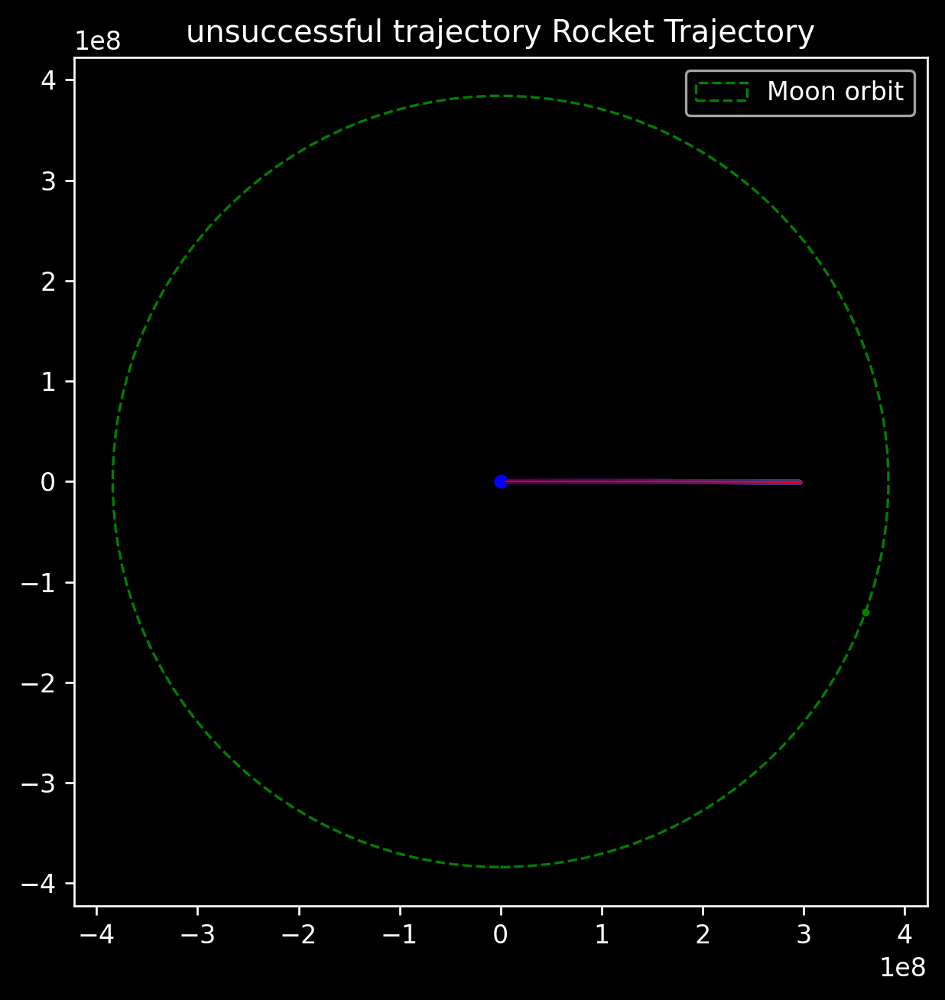

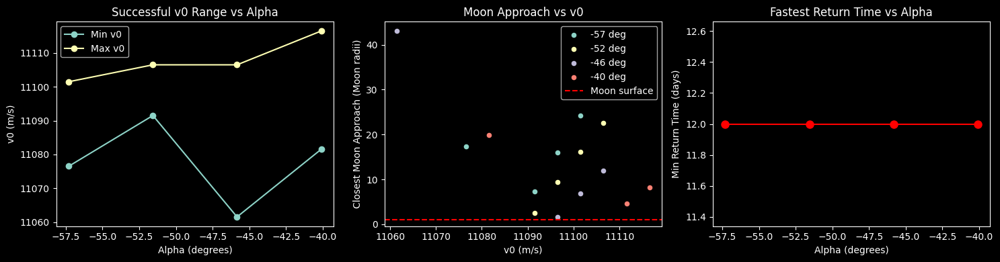

In [38]:
#%matplotlib inline

# I found it a little hard to plot this as sub plots, here I used Claude for help with 
# organizing and amke this

# 2. Make the plots

fig, axes = plt.subplots(1, 3, figsize=(15, 4))

# First, collect data for plotting
alpha_list = []
v0_min_list = []
v0_max_list = []
min_time_list = []

for alpha in alphas:
    if len(results[alpha]) > 0:  # only if we have successful ones
        alpha_list.append(alpha)
        
        # Find min and max v0
        v0s = []
        times = []
        for r in results[alpha]:
            v0s.append(r['v0'])
            times.append(r['return_time'])
        
        v0_min_list.append(min(v0s))
        v0_max_list.append(max(v0s))
        min_time_list.append(min(times) / (24*60*60))  # convert to days

print(f"Alphas with successful trajectories: {alpha_list}")

# Plot 1: v0 range vs alpha
ax1 = axes[0]
ax1.plot(np.degrees(alpha_list), v0_min_list, 'o-', label='Min v0')
ax1.plot(np.degrees(alpha_list), v0_max_list, 'o-', label='Max v0')
ax1.set_xlabel('Alpha (degrees)')
ax1.set_ylabel('v0 (m/s)')
ax1.set_title('Successful v0 Range vs Alpha')
ax1.legend()

# Plot 2: Closest Moon approach vs v0
ax2 = axes[1]
for alpha in alpha_list:
    v0s = []
    moon_dists = []
    for r in results[alpha]:
        v0s.append(r['v0'])
        moon_dists.append(r['min_moon'] / RM)  # in Moon radii
    ax2.scatter(v0s, moon_dists, label=f'{np.degrees(alpha):.0f} deg', s=20)

ax2.axhline(y=1, color='r', linestyle='--', label='Moon surface')
ax2.set_xlabel('v0 (m/s)')
ax2.set_ylabel('Closest Moon Approach (Moon radii)')
ax2.set_title('Moon Approach vs v0')
ax2.legend()

# Plot 3: Min return time vs alpha
ax3 = axes[2]
ax3.plot(np.degrees(alpha_list), min_time_list, 'ro-', markersize=8)
ax3.set_xlabel('Alpha (degrees)')
ax3.set_ylabel('Min Return Time (days)')
ax3.set_title('Fastest Return Time vs Alpha')

plt.tight_layout()
plt.show()

If you see multiple plots above, jsut re run the above. I was not able to fidn why this happens, i used show(), but that still didnt happen

### 3. Analysis: Largest $|\alpha|$ for Successful Trip

From my parameter sweep above, the largest $|\alpha|$ that still allows a successful free-return is around -1.0 rad. 

Beyond this, the Moon is too far ahead by the time the rocket reaches Moon's orbit, the Moon has already moved away, so we can't get the gravitational assist we need to swing back to Earth.

### 4. Best $\alpha$ and $v_0$?

- To minimize time (less food): Use smaller $|\alpha|$ like $-0.6$ rad with higher $v_0$. You get there and back faster, but you burn more fuel.

- To minimize fuel (lower $v_0$): Use $\alpha$ around $-0.7$ to $-0.8$ rad. You can launch with lower velocity and still make it back, but the trip takes longer.


$\alpha \approx -0.7$ rad with $v_0 = v_0(D) + 15$ m/s seems like a good balance. You get approximately a 6–7 day trip with reasonable fuel use, and there's some margin for error in case something goes wrong.

## Task 5: Reflection

1. Really nice, I loved this one because of all the cool animations. I am really curious to see how we could do this in reverse, I guess that's what an inverse problem is? Meaning, we can find exactly the initial conditions given the final position.

2. All good. 